<a href="https://colab.research.google.com/github/nehaaggarwal6871/Image-Captioning/blob/master/ImageCaptioning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import tensorflow as tf
from google.colab import drive
from tensorflow import keras
import matplotlib.pyplot as plt
from keras.applications.vgg16 import preprocess_input
from keras.applications.vgg16 import VGG16
from keras.layers import Input
from keras.preprocessing.text import one_hot
from keras.utils.np_utils import to_categorical
from keras.preprocessing.sequence import pad_sequences
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
# from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.models import Model
# from keras.preprocessing.sequence import pad_sequences
# from keras.utils import to_categorical
import numpy as np
from numpy import array
import pandas as pd
import cv2
from glob import glob
import PIL
import time
from tqdm import tqdm

from os import listdir
import pickle
from pickle import dump

In [3]:
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [4]:
!unzip gdrive/My\ Drive/ml_dataset/Image_captioning_Dataset.zip > /dev/null

In [5]:
image_path='/content/Flicker8k_Dataset/'
images = glob(image_path+ '*.jpg')
len(images)

8091

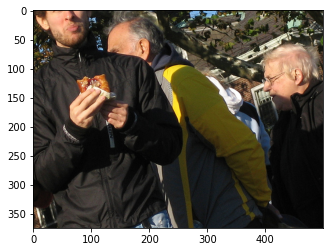

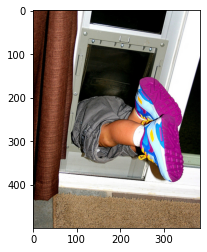

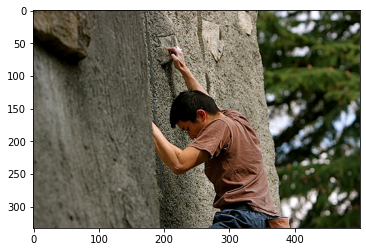

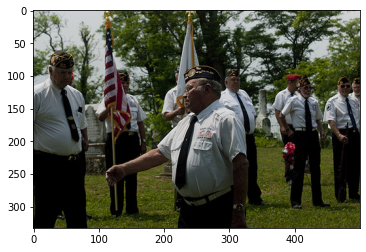

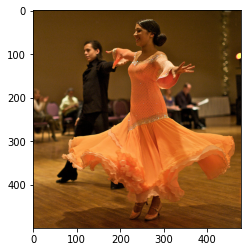

In [6]:
for i in range(5):
  plt.figure()
  image=cv2.imread(images[i])
  image=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
  plt.imshow(image)

In [7]:
path= '/content/gdrive/MyDrive/ml_dataset/set_0.pkl'
mydataset=pickle.load(open(path, 'rb'))
mydataset

['318667317_108c402140.jpg#4\tA man in a black hoodie be hold a paper sign .',
 '2072574835_febf0c5fb9.jpg#4\tThree race dog be run out of the start gate on a track .',
 '3083016677_5782bc337c.jpg#4\tTwo motorcycle with two rider each .',
 '95734038_2ab5783da7.jpg#0\tA man on a bike nest to a river .',
 '241346146_f27759296d.jpg#1\tA football player try tackle another player who have the ball .',
 '3182405529_7692256746.jpg#2\tan old man with long gray hair and a long gray beard bike ride on the shore .',
 '3278777548_290b881018.jpg#1\tFour person walk on a bridge over a body of water .',
 '3621717946_d96f8a6012.jpg#3\tTwo swimmer be play a water sport with a yellow ball and a net .',
 '3542425197_2ef81c6051.jpg#1\tA woman in white lighting talk to a man light in green .',
 '3384742888_85230c34d5.jpg#3\tDog chew up ball while roll in grass',
 '514036362_5f2b9b7314.jpg#0\tA girl wear a black top be smile with a silver truck in the background .',
 '3331797838_b3e33dbe17.jpg#3\tTwo person

In [8]:
images_id=[]
captions=[]

data=dict()

for i,ex in enumerate(mydataset):
  details=ex.split('\t')
  images_id.append(details[0].split('.jpg')[0])
  captions.append(details[1])

  if images_id[i] not in data:
    data[images_id[i]]=list()
  data[images_id[i]].append(captions[i])


# print(len(images_id))  
# print(images_id)
# print(len(captions))
# print(captions)
print(data)

{'318667317_108c402140': ['A man in a black hoodie be hold a paper sign .', 'A homeless man carry a sign that say " hungry " .', 'A bearded man hold a sign .', 'A man in a black hoodie hold a small sign .'], '2072574835_febf0c5fb9': ['Three race dog be run out of the start gate on a track .', 'Greyhound dog wear race stripe be run out of a gate on a track .', 'Dog in a race .'], '3083016677_5782bc337c': ['Two motorcycle with two rider each .', 'There be two motorcycle with a man and a woman on it .', 'Two guy with helmet be on motorcycle , each with a woman ride behind him', 'Two motorcycle and four rider be on a road .'], '95734038_2ab5783da7': ['A man on a bike nest to a river .', 'A man ride a bicycle on a rocky path beside a lake in the mountain .', 'A man stand astride a bike on a rocky trail by a lake .'], '241346146_f27759296d': ['A football player try tackle another player who have the ball .', 'A Sooner football player carry the ball be try to avoid be tackle .', 'A football p

In [9]:
len(data)
list(data.keys())[:10]
data['2072574835_febf0c5fb9']

['Three race dog be run out of the start gate on a track .',
 'Greyhound dog wear race stripe be run out of a gate on a track .',
 'Dog in a race .']


# **Cleanse and Preprocessing**

In [10]:
def cleanse_data(data):
  dict_1=dict()
  for key,value in data.items():
    for i in range(len(value)):
      lines=""
      line1=value[i]
      for j in line1.split():
        if len(j)<2:
          continue
        j=j.lower()
        lines+=j+" "
      if key not in dict_1:
        dict_1[key] = list()
      dict_1[key].append(lines)

  return dict_1

data2 = cleanse_data(data)
len(data2)
data2

{'318667317_108c402140': ['man in black hoodie be hold paper sign ',
  'homeless man carry sign that say hungry ',
  'bearded man hold sign ',
  'man in black hoodie hold small sign '],
 '2072574835_febf0c5fb9': ['three race dog be run out of the start gate on track ',
  'greyhound dog wear race stripe be run out of gate on track ',
  'dog in race '],
 '3083016677_5782bc337c': ['two motorcycle with two rider each ',
  'there be two motorcycle with man and woman on it ',
  'two guy with helmet be on motorcycle each with woman ride behind him ',
  'two motorcycle and four rider be on road '],
 '95734038_2ab5783da7': ['man on bike nest to river ',
  'man ride bicycle on rocky path beside lake in the mountain ',
  'man stand astride bike on rocky trail by lake '],
 '241346146_f27759296d': ['football player try tackle another player who have the ball ',
  'sooner football player carry the ball be try to avoid be tackle ',
  'football player be run with the ball as player of the oppose team 

# **Create the vocabulary of the words and find the unique words. Then, update the unique words that will be used to make predictions**

In [11]:
# convert the following into a vocabulary of words and calculate the total words
def vocabulary(data2):
  all_desc=set()
  for key in data2.keys():
    [all_desc.update(d.split()) for d in data2[key]]
  return all_desc

#summarize voacbulry
vocabulary_data = vocabulary(data2)
print(len(vocabulary_data))
vocabulary_data


5531


{'inverted',
 'hairy',
 'harvested',
 'overlook',
 'cable',
 'stunt-leap',
 'angel',
 'gather',
 'monkey',
 'bandana',
 'outfut',
 'jubilant',
 'fallen',
 'knotted',
 'rapids',
 'beachgoer',
 'change',
 'speaker',
 'curtain',
 'vinyl',
 'path',
 'pad',
 'soggy',
 'offf',
 'dandilions',
 'supplies',
 'tonge',
 'muzzle',
 'exibit',
 'portland',
 'put',
 'sheilding',
 'profession',
 'shower',
 'champ',
 'cold-weather',
 'whom',
 'leave',
 'mural',
 'modification',
 'assistance',
 'red-dressed',
 'musher',
 'routine',
 'security',
 'swampy',
 'maraca',
 't-shirt',
 'einstein',
 'lack',
 'texts',
 'steak',
 '-ependent',
 'stockcar',
 'family',
 'underneath',
 'puff',
 'rates',
 'main',
 'masses',
 'telephot',
 'electricity',
 'talk',
 'entrance',
 'lionist',
 'colapsable',
 'dirtracing',
 'butterfly-catcher',
 'bum',
 'spaniel',
 'introduce',
 'netted',
 'condominium',
 'tumble',
 'plant',
 'suggestively',
 'perch',
 'performs',
 'look-alike',
 'totter',
 'flatbed',
 'semi-cloudy',
 'motorc

In [12]:


def preprocess(image_path):
  # convert all images to 224 X 224 pixel
  img=keras.preprocessing.image.load_img(image_path,target_size=(224,224))

  #convert PIL image to numpy array of 3D
  x=keras.preprocessing.image.img_to_array(img)

  x= x.reshape((1,x.shape[0],x.shape[1],x.shape[2]))
  x = preprocess_input(x)
  return x



# **Load the model**

In [13]:
# input1 = VGG16(weights='imagenet')
in_layer=Input(shape=(224,224,3))
model = VGG16(weights='imagenet', include_top=False, input_tensor = in_layer, pooling ='avg')
model.summary()

58900480/58889256 [==============================] - 1s 0us/step
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                              

In [14]:
#extract features from each photo in the directory
def extract_features(directory):
  features=dict()

  for name in listdir(directory):
    filename = directory+ '/'+ name
    image=preprocess(filename)

    feature=model.predict(image,verbose=0)

    image_id=name.split('.')[0]
    features[image_id]=feature
    # print('>%s'%name)
  return features

features=extract_features(image_path)
print(len(features))
features

8091


{'278002800_3817135105': array([[0.00000000e+00, 5.42711782e+00, 2.64173090e-01, 7.57651255e-02,
         5.90048313e-01, 0.00000000e+00, 1.84028931e-02, 4.55325174e+00,
         2.64602757e+00, 5.61181962e-01, 4.32684183e+00, 7.06999779e+00,
         1.59251943e-01, 0.00000000e+00, 2.31420323e-01, 0.00000000e+00,
         3.37188697e+00, 1.68281808e-01, 1.08157627e-01, 2.53536320e+00,
         1.24721825e+00, 1.53287897e+01, 2.47669268e+00, 2.53509092e+00,
         5.32812297e-01, 4.85458946e+00, 0.00000000e+00, 5.70066310e-02,
         1.33198090e+01, 1.43735111e-01, 4.02104759e+00, 0.00000000e+00,
         2.95121670e-01, 1.82739010e+01, 0.00000000e+00, 0.00000000e+00,
         0.00000000e+00, 6.92148864e-01, 5.78812361e-01, 0.00000000e+00,
         7.35429108e-01, 1.20292354e+00, 1.96312651e-01, 1.01221144e+00,
         2.14866138e+00, 2.32565069e+00, 9.24568748e+00, 2.48525295e+01,
         1.37646332e-01, 1.01788497e+00, 1.58827886e-01, 4.52063608e+00,
         0.00000000e+00, 8.

In [15]:
print(len(features))
dump(features,open('features.pkl','wb'))

8091


In [16]:
def save_doc(data2, filename):
  lines=list()
  for key, desc in data2.items():
    for i in desc:
      lines.append(key+' '+i)
  temp_data='\n'.join(lines)
  file=open(filename,'w')
  file.write(temp_data)
  file.close()

save_doc(data2, 'descriptions.txt')

In [17]:

def load_doc(filename):
  f=open(filename,'r')
  text=f.read()
  f.close()
  return text

def load_clean_descriptions(filename):
  doc= load_doc(filename)
  descriptions=dict()
  for line in doc.split('\n'):
    tokens = line.split()
    image_id,image_desc=tokens[0],tokens[1:]
    descriptions[image_id]=' '.join(image_desc)
  return descriptions

descriptions= load_clean_descriptions('descriptions.txt')
descriptions

{'318667317_108c402140': 'man in black hoodie hold small sign',
 '2072574835_febf0c5fb9': 'dog in race',
 '3083016677_5782bc337c': 'two motorcycle and four rider be on road',
 '95734038_2ab5783da7': 'man stand astride bike on rocky trail by lake',
 '241346146_f27759296d': 'football player be run with the ball as player of the oppose team grab his leg',
 '3182405529_7692256746': 'white-bearded man ride bicycle on beach',
 '3278777548_290b881018': 'four person be walk on bridge',
 '3621717946_d96f8a6012': 'two swimmer in pool play at net with water polo ball',
 '3542425197_2ef81c6051': 'spotlight be on guitarist who be play in band',
 '3384742888_85230c34d5': 'black and tan dog play with toy and roll on the grass',
 '514036362_5f2b9b7314': 'woman wear black stand in front of pickup truck',
 '3331797838_b3e33dbe17': 'two bicyclist ride on road near green hill area one be blurry',
 '3372340429_91c4f4af30': 'three dog run around in the snow',
 '3634828052_3b6aeda7d6': 'woman take picture wi

In [18]:
desc_text = list(descriptions.values())

In [19]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(desc_text)
vocab_size = len(tokenizer.word_index)+1
print(vocab_size)
#integer encode descriptions

sequences = tokenizer.texts_to_sequences(desc_text)

max_length =max(len(s) for s in sequences)
print(max_length)
padded = pad_sequences(sequences,maxlen=max_length,padding='post')

y=to_categorical(padded,num_classes=vocab_size )

y=y.reshape((len(descriptions),max_length,vocab_size))

print(sequences)

3409
28
[[7, 1, 16, 699, 34, 47, 176], [5, 1, 99], [10, 194, 6, 111, 212, 2, 3, 142], [7, 20, 1160, 68, 3, 250, 244, 50, 180], [127, 65, 2, 17, 8, 4, 39, 74, 65, 9, 4, 659, 200, 1012, 31, 256], [14, 753, 7, 42, 143, 3, 69], [111, 15, 2, 35, 3, 326], [10, 1161, 1, 93, 18, 23, 700, 8, 24, 1162, 39], [1408, 2, 3, 1409, 227, 2, 18, 1, 511], [16, 6, 136, 5, 18, 8, 97, 6, 350, 3, 4, 41], [13, 21, 16, 20, 1, 45, 9, 1846, 414], [10, 386, 42, 3, 142, 60, 54, 116, 159, 48, 2, 701], [46, 5, 17, 90, 1, 4, 43], [13, 123, 120, 8, 57, 815, 88], [7, 455, 387], [46, 117, 18, 3, 92, 317], [16, 5, 2, 17, 36, 1410, 159, 8, 331, 1847], [28, 5, 218, 3, 32, 151], [7, 1, 26, 33, 115, 486, 1848, 6, 12, 8, 188, 1163, 1, 55, 130, 2, 85], [15, 2, 161, 8, 53, 625, 241, 54, 94], [10, 5, 18, 152, 1, 4, 43], [25, 1013, 127, 65, 399, 19, 233, 4, 39], [16, 6, 53, 201, 2, 269, 1849, 38, 512, 3, 4, 124, 135], [14, 5, 8, 304, 28, 754, 86, 102, 1, 31, 58, 6, 31, 755, 1, 4, 43], [111, 7, 22, 1, 144, 145], [27, 318, 1, 24, 6

In [20]:
X,y =list(),list()

for img_no, seq in enumerate(sequences):
  for i in range(1,len(seq)):
    in_seq,out_seq = seq[:i],seq[i]
    in_seq = pad_sequences([in_seq],maxlen=max_length)[0]
    out_seq = to_categorical([out_seq],num_classes=vocab_size)[0]

    X.append(in_seq)
    y.append(out_seq)

X,y=array(X),array(y)
y
print(X.shape)
print(y.shape)

(64920, 28)
(64920, 3409)


In [21]:
def create_tokenizer(descriptions):
  lines=list(descriptions.values())
  tokenizer = Tokenizer()
  tokenizer.fit_on_texts(lines)
  return tokenizer

def load_photo(filename):
  image = load_img(filename,target_size=(224,224))

  image= img_to_array(image)

  image=image.reshape((1,image.shape[0],image.shape[1],image.shape[2]))

  image = preprocess_input(image)[0]
  image_id = filename.split('/')[-1].split('.')[0]
  return image, image_id

def create_sequences(tokenizer,max_length,desc,image):
  Ximages,Xseq, y=list(),list(),list()

  vocab_size = len(tokenizer.word_index)+1
  for i in range(1,len(seq)):
    in_seq,out_seq = seq[:i],seq[i]
    in_seq = pad_sequences([in_seq],maxlen=max_length)[0]
    out_seq = to_categorical([out_seq],num_classes=vocab_size)[0]

    Ximages.append(image)
    Xseq.append(in_seq)
    y.append(out_seq)
  Ximages,Xseq,y= array(Ximages),array(Xseq),array(y)
  return [Ximages,Xseq,y]


def data_generator(descriptions,tokenizer,max_length):
  directory = '/content/Flicker8k_Dataset/'
  while 1:
    for name in listdir(directory):
      filename = directory+name
      image,image_id = load_photo(filename)

      desc=descriptions[image_id]
      in_img,in_seq,out_word =create_sequences(tokenizer,max_length,desc,image)
      yield [[in_img,in_seq],out_word]

generator = data_generator(descriptions,tokenizer,max_length)
inputs,outputs = next(generator)
print(inputs[0].shape)
print(inputs[1].shape)

print(outputs.shape)

(8, 224, 224, 3)
(8, 28)
(8, 3409)


In [22]:
model.compile(optimizer=tf.keras.optimizers.Adam(),loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

model.fit_generator(generator,epochs=5,steps_per_epoch=7000,verbose=1)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  This is separate from the ipykernel package so we can avoid doing imports until


Epoch 1/5


ValueError: ignored